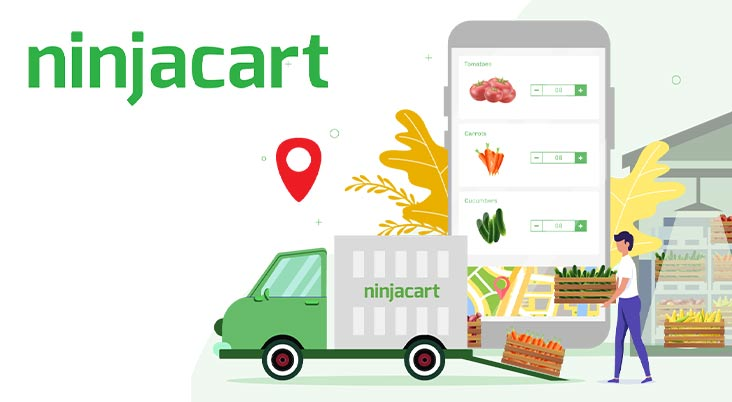

## About Ninjacart 🚛

Ninjacart is India’s leading fresh produce supply chain company, revolutionizing the way fruits and vegetables are moved from farms to stores. Founded with the vision to solve one of the world's most challenging logistical problems, Ninjacart leverages cutting-edge technology, data science, and automation to bridge the gap between farmers and retailers. The company has established a fast, reliable, and efficient supply chain capable of sourcing fresh produce directly from farmers and delivering it to retailers, restaurants, and service providers within 12 hours. This innovation not only reduces wastage but also ensures better pricing and quality for both farmers and consumers.



---



## Business Problem 💡

Ninjacart is working on developing a robust image classification system that can accurately identify different types of vegetables from images. As part of this initiative, they aim to build a multiclass classifier capable of distinguishing between images of onions, potatoes, and tomatoes, as well as identifying irrelevant or mixed-content images as noise.

The dataset provided consists of a structured collection of images divided into training and testing sets, with each set containing four categories:

*   Onions
*   Potatoes
*   Tomatoes
*   Market Scenes (to be treated as noise)

The objective is to train a computer vision model that can classify images into these four categories with high accuracy. This solution is intended to help Ninjacart streamline its sorting and categorization process, which is critical for maintaining quality and speed across its supply chain.



---



## Importing Required Libraries 🤝

In [48]:
# !pip install opencv-python
# !pip install tensorflow

In [49]:
import os
import glob
import cv2

import random
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.optimizers import SGD
tf.keras.utils.set_random_seed(111)

# To supress any warnings during the flow
import warnings
warnings.filterwarnings('ignore')

plt.rcParams.update({'font.size': 14})


---

## Loading the Data 🔍

In [50]:
!gdown https://drive.google.com/uc?id=1clZX-lV_MLxKHSyeyTheX5OCQtNCUcqT

Downloading...
From (original): https://drive.google.com/uc?id=1clZX-lV_MLxKHSyeyTheX5OCQtNCUcqT
From (redirected): https://drive.google.com/uc?id=1clZX-lV_MLxKHSyeyTheX5OCQtNCUcqT&confirm=t&uuid=55098de3-fc86-4af6-871c-130399b21303
To: /content/ninjacart_data.zip
100% 275M/275M [00:04<00:00, 64.1MB/s]


In [51]:
if not os.path.isdir('ninjacart_data'):
	os.system('unzip ninjacart_data.zip')

In [52]:
train_datapath = 'ninjacart_data/train/'
test_datapath = 'ninjacart_data/test/'

# Configurations:
BATCH_SIZE = 64
IMAGE_SIZE = (256, 256)
RANDOM_SEED = 42
tf.random.set_seed(10)
np.random.seed(10)

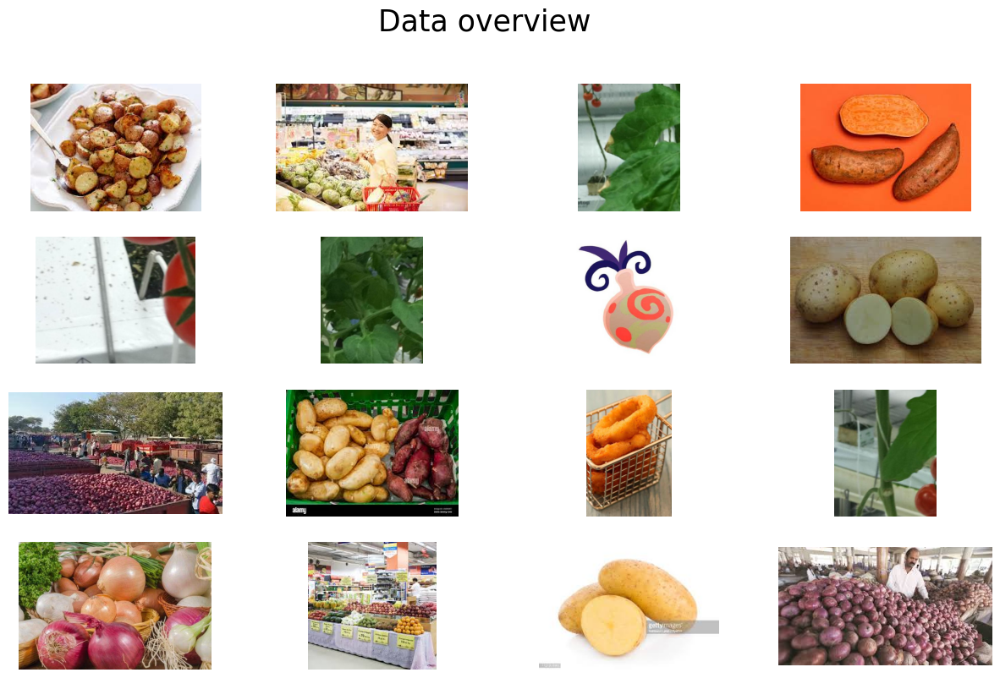

In [53]:
images = []
for folder in os.listdir(train_datapath):
  for image in os.listdir(train_datapath + '/' + folder):
    images.append(os.path.join(train_datapath, folder, image))

fig = plt.figure(1, figsize=(15, 9))
fig.suptitle('Data overview', fontsize=25)
plt.axis('off')
n = 0
for i in range(16):
  n += 1
  random_img = random.choice(images)
  imgs = tf.keras.utils.load_img(random_img)
  plt.subplot(4, 4, n)
  plt.axis('off')
  plt.imshow(imgs)

plt.show()

In [54]:
class_dirs = os.listdir(train_datapath)
image_dict = {}
count_dict = {}

for cls in class_dirs:
    file_paths = glob.glob(f'{train_datapath}{cls}/*')
    count_dict[cls] = len(file_paths)
    image_path = random.choice(file_paths)
    image_dict[cls] = tf.keras.utils.load_img(image_path)

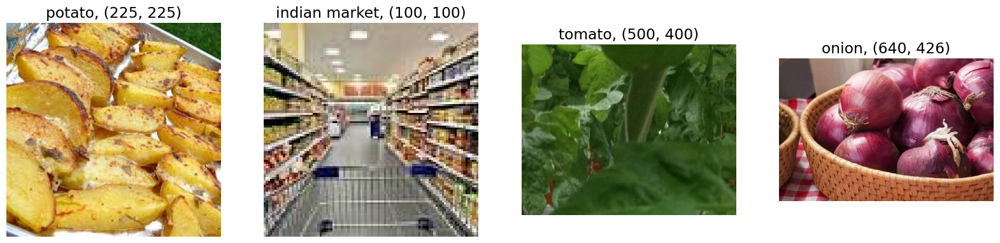

In [55]:
plt.figure(figsize=(20, 15))
for i, (cls,img) in enumerate(image_dict.items()):
    ax = plt.subplot(3, 4, i + 1)
    plt.imshow(img)
    plt.title(f'{cls}, {img.size}')
    plt.axis("off")

## Class Distribution Analysis 📊

Count of training samples per class:
            class  count
0         potato    898
1  indian market    599
2         tomato    789
3          onion    849


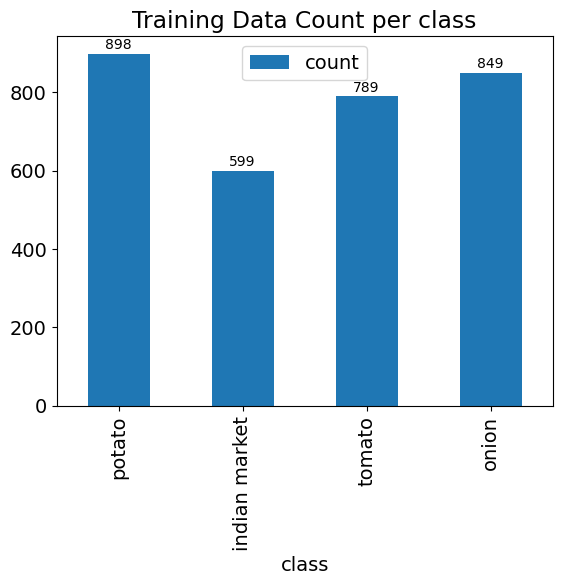

In [56]:
df_count_train = pd.DataFrame({
    "class": count_dict.keys(),     # keys of count_dict are class labels
    "count": count_dict.values(),   # value of count_dict contain counts of each class
})
print("Count of training samples per class:\n", df_count_train)

# draw a bar plot using pandas in-built plotting function
df_count_train.plot.bar(x='class', y='count', title="Training Data Count per class")
for i, v in enumerate(df_count_train['count']):
    # add value labels on top of each bar
    plt.text(i, v + 5, str(v), ha='center', va='bottom', fontsize=10)

Count of training samples per class:
            class  count
0         potato     81
1  indian market     81
2         tomato    106
3          onion     83


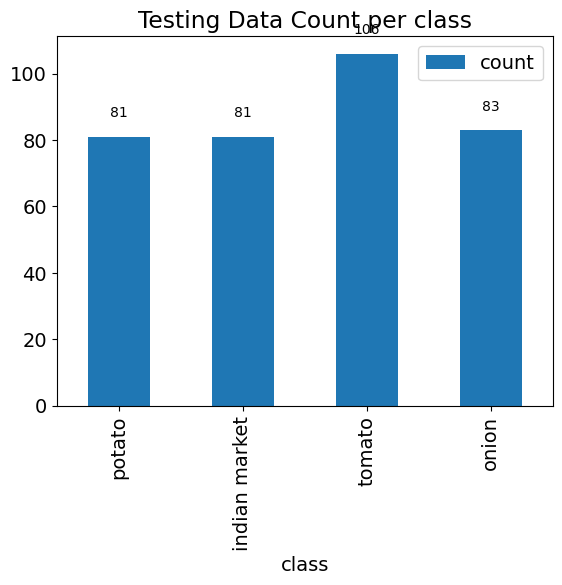

In [57]:
class_dirs = os.listdir(test_datapath)
image_dict = {}
count_dict = {}

for cls in class_dirs:
    file_paths = glob.glob(f'{test_datapath}{cls}/*')
    count_dict[cls] = len(file_paths)
    image_path = random.choice(file_paths)
    image_dict[cls] = tf.keras.utils.load_img(image_path)

## Let's now Plot the Data Distribution of Testing Data across Classes
df_count_train = pd.DataFrame({
    "class": count_dict.keys(),     # keys of count_dict are class labels
    "count": count_dict.values(),   # value of count_dict contain counts of each class
})
print("Count of training samples per class:\n", df_count_train)

# draw a bar plot using pandas in-built plotting function
df_count_train.plot.bar(x='class', y='count', title="Testing Data Count per class")
for i, v in enumerate(df_count_train['count']):
    # add value labels on top of each bar
    plt.text(i, v + 5, str(v), ha='center', va='bottom', fontsize=10)

### Observation 👨‍🔬

*   Number of images in the Training folder matches the reported number.
*   Number of images in the Testing folder matches the reported number.
  *   potato has 83 images, where as reported as 81 images
  *   onion has 81 images, where as reported as 83 images
*   Images are not all of uniform dimensions.



---




## Utility Functions

In [58]:
train_ds = tf.keras.utils.image_dataset_from_directory(
    train_datapath, seed=RANDOM_SEED, validation_split=0.2, subset='training',
    label_mode='categorical', image_size=IMAGE_SIZE, batch_size=BATCH_SIZE)

val_ds   = tf.keras.utils.image_dataset_from_directory(
    train_datapath, seed=RANDOM_SEED, validation_split=0.2, subset='validation',
    label_mode='categorical', image_size=IMAGE_SIZE, batch_size=BATCH_SIZE)

test_ds  = tf.keras.utils.image_dataset_from_directory(
    test_datapath,
    label_mode='categorical', image_size=IMAGE_SIZE, batch_size=BATCH_SIZE,
    shuffle=False)            # keep order for the confusion matrix later

class_names = train_ds.class_names
print(class_names)

Found 3135 files belonging to 4 classes.
Using 2508 files for training.
Found 3135 files belonging to 4 classes.
Using 627 files for validation.
Found 351 files belonging to 4 classes.
['indian market', 'onion', 'potato', 'tomato']


In [75]:
class_names = train_ds.class_names
print(class_names)

['indian market', 'onion', 'potato', 'tomato']


In [59]:
def training_plot(metrics, history):
  f, ax = plt.subplots(1, len(metrics), figsize=(5*len(metrics), 5))
  for idx, metric in enumerate(metrics):
    ax[idx].plot(history.history[metric], ls='dashed')
    ax[idx].set_xlabel("Epochs")
    ax[idx].set_ylabel(metric)
    ax[idx].plot(history.history['val_' + metric]);
    ax[idx].legend([metric, 'val_' + metric])

In [82]:
def conf_mat(class_path, pred_list, model_name) :
    noise, tomato, potato, onion = 0, 0, 0, 0
    for i in os.listdir(class_path):

        img = tf.keras.utils.load_img(class_path + "/" + str(i))
        img = tf.keras.utils.img_to_array(img)
        img = tf.image.resize(img, (256, 256))
        img = tf.expand_dims(img, axis = 0)

        pred = model_name.predict(img, verbose=0)
        predicted = tf.argmax(pred, 1).numpy().item()

        if predicted == 0:
            noise+= 1
        elif predicted == 1:
            onion+= 1
        elif predicted == 2:
            potato+= 1
        else:
            tomato+= 1


    for item in noise, onion, potato, tomato :
        pred_list.append(item)

def plot_confusion_matrix(model):
  sns.set(rc={'figure.figsize':(11.7, 8.27)})
  sns.set(font_scale=1.2)


  noise, tomato, potato, onion = 0, 0, 0, 0

  l1 = []
  l2 = []
  l3 = []
  l4 = []

  conf_mat(noise_path, l1, model)
  conf_mat(onion_path, l2, model)
  conf_mat(potato_path, l3, model)
  conf_mat(tomato_path, l4, model)

  ax = sns.heatmap([l1, l2, l3, l4], xticklabels=class_names, yticklabels=class_names, annot=True, fmt='g')
  ax.set(xlabel='Predicted label', ylabel='True label')
  plt.show()

def get_class_names(dataset_path):
    class_names = os.listdir(dataset_path)
    return class_names

def get_test_labels(test_ds):
    y_true = []
    for _, labels in test_ds:
        y_true.extend(labels.numpy())
    return np.array(y_true)

In [107]:
noise_path = 'ninjacart_data/test/indian market'
onion_path = 'ninjacart_data/test/onion'
potato_path = 'ninjacart_data/test/potato'
tomato_path = 'ninjacart_data/test/tomato'


def classwise_accuracy(class_path, class_name, model_name) :
    paths = []
    for i in os.listdir(class_path):
        paths.append(class_path + "/" + str(i))

    correct = 0
    total = 0

    for i in range(len(paths)):
        total+= 1

        img = tf.keras.utils.load_img(paths[i])
        img = tf.keras.utils.img_to_array(img)
        img = tf.image.resize(img, (256, 256))
        img = tf.expand_dims(img, axis = 0)

        pred = model_name.predict(img, verbose=0)
        class_names = train_ds.class_names
        if tf.argmax(pred[0]) == class_names.index(f"{class_name}"):
            correct+= 1

    print(f"Accuracy for class {class_name} is {round((correct/total)*100, 2)}% consisting of {len(paths)} images")

In [62]:
def grid_test_model(model_name):

  fig = plt.figure(1, figsize=(17, 11))
  plt.axis('off')
  n = 0
  for i in range(8):
    n += 1

    img_0 = tf.keras.utils.load_img(random.choice(test_images))
    img_0 = tf.keras.utils.img_to_array(img_0)
    img_0 = tf.image.resize(img_0, IMAGE_SIZE)
    img_1 = tf.expand_dims(img_0, axis = 0)

    pred = model_name.predict(img_1)
    predicted_label = tf.argmax(pred, 1).numpy().item()

    for item in pred :
      item = tf.round((item*100))

    plt.subplot(2, 4, n)
    plt.axis('off')
    plt.title(f'prediction : {class_names[predicted_label]}\n\n'
              f'{item[0]} % {class_names[0]}\n'
              f'{item[1]} % {class_names[1]}\n'
              f'{item[2]} % {class_names[2]}\n'
              f'{item[3]} % {class_names[3]}\n')
    plt.imshow(img_0/255)
  plt.show()



---



## Custom CNN Model

In [63]:
def create_cnn_classifier(input_shape=(256, 256, 3), num_classes=10):
    model = tf.keras.models.Sequential()

    model.add(layers.Rescaling(1./255,  input_shape=(*IMAGE_SIZE, 3)))

    # First Convolutional Layer
    model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=input_shape))
    model.add(layers.MaxPooling2D((2, 2)))

    # Second Convolutional Layer
    model.add(layers.Conv2D(64, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))

    # Third Convolutional Layer
    model.add(layers.Conv2D(128, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))

    # Flatten the output and add Dense layers
    model.add(layers.Flatten())
    model.add(layers.Dense(128, activation='relu'))
    model.add(layers.Dropout(0.5))  # Dropout for regularization
    model.add(layers.Dense(num_classes, activation='softmax'))

    # Compile the model
    model.compile(optimizer=tf.keras.optimizers.Adam(1e-4),
                  loss=tf.keras.losses.CategoricalCrossentropy(),
                  metrics=[tf.keras.metrics.CategoricalAccuracy(name='acc'),
                          tf.keras.metrics.Precision(name='precision'),
                          tf.keras.metrics.Recall(name='recall')]
                  )

    return model

input_shape = (256, 256, 3)  # Image dimensions
num_classes = 4  # Number of classes in your dataset
cnn_model = create_cnn_classifier(input_shape, num_classes)

# Summary of the model
cnn_model.summary()

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_4 (Rescaling)         │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 125, 125, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 62, 62, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 60, 60, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 30, 30, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 115200)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 128)            │    14,745,728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,839,492 (56.61 MB)

 Trainable params: 14,839,492 (56.61 MB)

 Non-trainable params: 0 (0.00 B)

In [65]:
log_dir = "logs/Custom_CNN"
tensorboard_cb = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

print(cnn_model.optimizer.get_config())
history = cnn_model.fit(train_ds,  epochs=10,
                    validation_data=val_ds,
                    callbacks=[tensorboard_cb]
                   )

{'name': 'adam', 'learning_rate': 9.999999747378752e-05, 'weight_decay': None, 'clipnorm': None, 'global_clipnorm': None, 'clipvalue': None, 'use_ema': False, 'ema_momentum': 0.99, 'ema_overwrite_frequency': None, 'loss_scale_factor': None, 'gradient_accumulation_steps': None, 'beta_1': 0.9, 'beta_2': 0.999, 'epsilon': 1e-07, 'amsgrad': False}
Epoch 1/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 15s 370ms/step - acc: 0.8843 - loss: 0.3160 - precision: 0.9085 - recall: 0.8648 - val_acc: 0.8357 - val_loss: 0.3929 - val_precision: 0.8522 - val_recall: 0.8182
Epoch 2/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 18s 299ms/step - acc: 0.9192 - loss: 0.2597 - precision: 0.9303 - recall: 0.8952 - val_acc: 0.8246 - val_loss: 0.4002 - val_precision: 0.8465 - val_recall: 0.8182
Epoch 3/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 12s 298ms/step - acc: 0.9007 - loss: 0.2818 - precision: 0.9150 - recall: 0.8827 - val_acc: 0.8325 - val_loss: 0.4162 - val_precision: 0.8432 - val_recall: 0.8150
Epoch 4/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 25s 404ms/ste

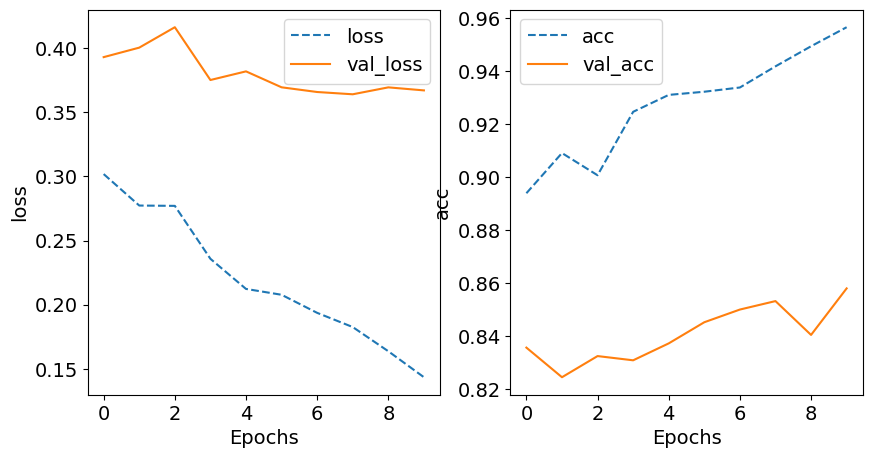

In [66]:
training_plot(['loss', 'acc'], history)

In [69]:
# Evaluate the model
result = cnn_model.evaluate(test_ds, verbose=2)
dict(zip(cnn_model.metrics_names, result))

6/6 - 1s - 147ms/step - acc: 0.8063 - loss: 0.5087 - precision: 0.8110 - recall: 0.7949


{'loss': 0.5087159872055054, 'compile_metrics': 0.8062677979469299}

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 778ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


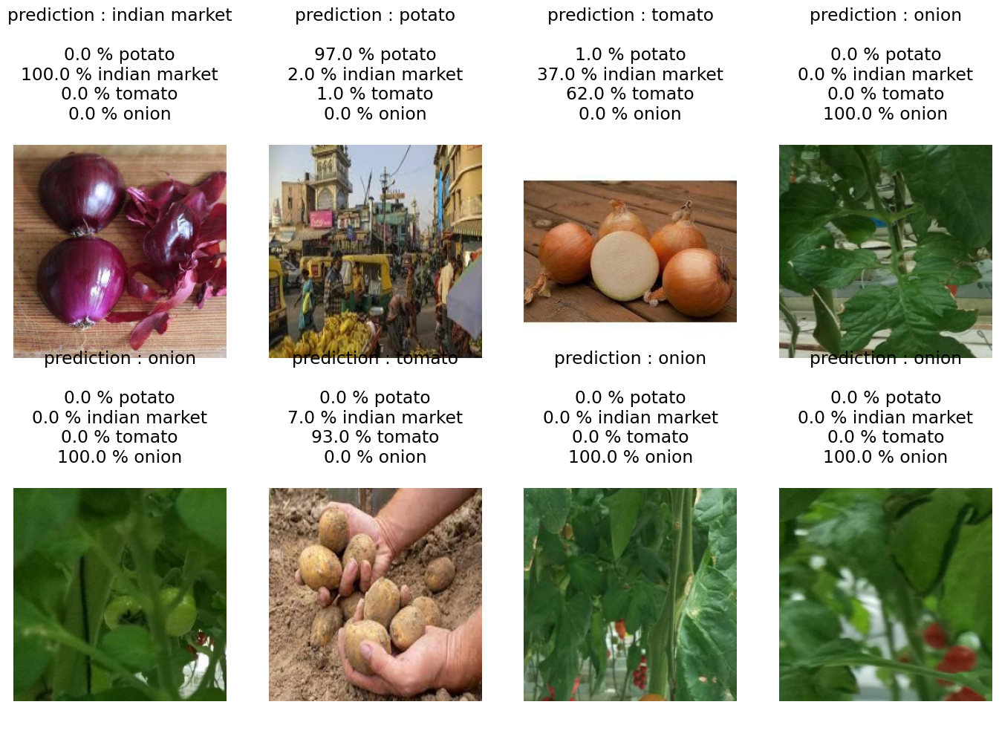

In [70]:
test_images = []

test_dir = 'ninjacart_data/test/'
class_names = os.listdir(test_dir)
for folder in os.listdir(test_dir):

  for image in os.listdir(test_dir + '/' + folder):
    test_images.append(os.path.join(test_dir, folder, image))

grid_test_model(cnn_model)

In [71]:
classwise_accuracy(noise_path, 'indian market', cnn_model)
classwise_accuracy(onion_path, 'onion', cnn_model)
classwise_accuracy(potato_path, 'potato', cnn_model)
classwise_accuracy(tomato_path, 'tomato', cnn_model)

Accuracy for class indian market is 37.04% consisting of 81 images
Accuracy for class onion is 0.0% consisting of 83 images
Accuracy for class potato is 6.17% consisting of 81 images
Accuracy for class tomato is 0.0% consisting of 106 images


6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step


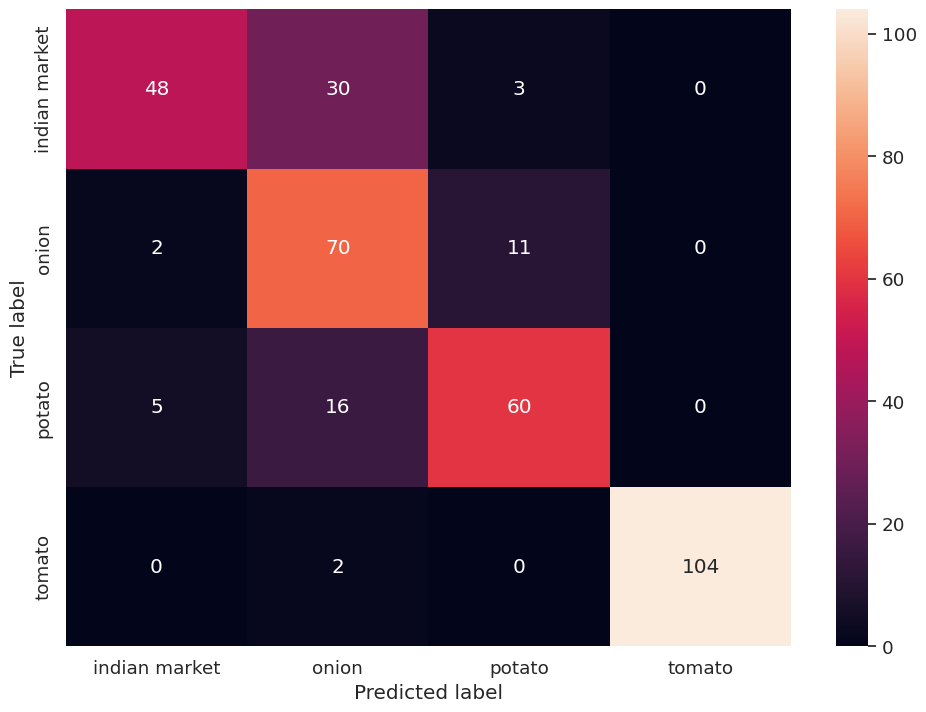

In [83]:
# Get true labels from the test dataset
y_true = get_test_labels(test_ds)
# Get predictions from the model (predict on the whole dataset at once)
y_pred_probs = cnn_model.predict(test_ds)
y_pred = np.argmax(y_pred_probs, axis=1)
# Plot confusion matrix
plot_confusion_matrix(cnn_model)

## CNN - Overfitting Handling

In [84]:
augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal_and_vertical"),
    tf.keras.layers.RandomRotation(0.2),
    tf.keras.layers.RandomTranslation(height_factor = 0.2, width_factor=0.2)
])


AUTOTUNE = tf.data.AUTOTUNE
train_tuned_ds = (train_ds
            .map(lambda x, y: (augmentation(x, training=True), y),
                 num_parallel_calls=AUTOTUNE)
            .prefetch(AUTOTUNE))
val_tuned_ds   = val_ds.prefetch(AUTOTUNE)
test_tuned_ds  = test_ds.prefetch(AUTOTUNE)

In [85]:
def create_revamp_cnn_classifier(input_shape=(256, 256, 3), num_classes=10):
    model = tf.keras.models.Sequential()

    model.add(layers.Rescaling(1./255,  input_shape=(*IMAGE_SIZE, 3)))

    # First Convolutional Layer
    model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=input_shape))
    model.add(layers.MaxPooling2D((2, 2)))

    # Second Convolutional Layer
    model.add(layers.Conv2D(64, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))

    # Third Convolutional Layer
    model.add(layers.Conv2D(128, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))

    # Flatten the output and add Dense layers
    model.add(layers.Flatten())
    model.add(layers.Dense(128, activation='relu'))
    model.add(layers.Dropout(0.5))  # Dropout for regularization
    model.add(layers.Dense(num_classes, activation='softmax'))

    # Compile the model
    model.compile(optimizer=tf.keras.optimizers.Adam(1e-4),
                  loss=tf.keras.losses.CategoricalCrossentropy(),
                  metrics=[tf.keras.metrics.CategoricalAccuracy(name='acc'),
                          tf.keras.metrics.Precision(name='precision'),
                          tf.keras.metrics.Recall(name='recall')]
                  )

    return model

input_shape = (256, 256, 3)  # Image dimensions
num_classes = 4  # Number of classes in your dataset
revamp_cnn_model = create_revamp_cnn_classifier(input_shape, num_classes)

# Summary of the model
revamp_cnn_model.summary()

Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_5 (Rescaling)         │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 125, 125, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 62, 62, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 60, 60, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 30, 30, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 115200)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 128)            │    14,745,728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,839,492 (56.61 MB)

 Trainable params: 14,839,492 (56.61 MB)

 Non-trainable params: 0 (0.00 B)

In [86]:
log_dir = "logs/Custom_Revamped_CNN"
tensorboard_cb = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
checkpoint_cb = tf.keras.callbacks.ModelCheckpoint("CNN_best_augmented.keras", save_best_only = True)

early_stopping_cb = tf.keras.callbacks.EarlyStopping(
    monitor = 'val_loss', patience = 5, restore_best_weights = True
)

revamp = revamp_cnn_model.fit(train_tuned_ds,  epochs=30,
                    validation_data=val_tuned_ds,
                    callbacks=[tensorboard_cb, checkpoint_cb, early_stopping_cb]
                   )

Epoch 1/30
40/40 ━━━━━━━━━━━━━━━━━━━━ 55s 1s/step - acc: 0.3647 - loss: 1.3077 - precision: 0.4664 - recall: 0.0325 - val_acc: 0.6826 - val_loss: 0.8127 - val_precision: 0.7947 - val_recall: 0.5311
Epoch 2/30
40/40 ━━━━━━━━━━━━━━━━━━━━ 75s 1s/step - acc: 0.6982 - loss: 0.8482 - precision: 0.7868 - recall: 0.5184 - val_acc: 0.7289 - val_loss: 0.7114 - val_precision: 0.7852 - val_recall: 0.6587
Epoch 3/30
40/40 ━━━━━━━━━━━━━━━━━━━━ 80s 1s/step - acc: 0.7144 - loss: 0.7604 - precision: 0.7837 - recall: 0.6156 - val_acc: 0.7209 - val_loss: 0.6917 - val_precision: 0.7586 - val_recall: 0.6667
Epoch 4/30
40/40 ━━━━━━━━━━━━━━━━━━━━ 81s 1s/step - acc: 0.7472 - loss: 0.6868 - precision: 0.8028 - recall: 0.6769 - val_acc: 0.7480 - val_loss: 0.6125 - val_precision: 0.7952 - val_recall: 0.6874
Epoch 5/30
40/40 ━━━━━━━━━━━━━━━━━━━━ 83s 1s/step - acc: 0.7768 - loss: 0.6509 - precision: 0.8307 - recall: 0.6994 - val_acc: 0.7783 - val_loss: 0.5456 - val_precision: 0.8221 - val_recall: 0.7368
Epoch 6/30

6/6 - 2s - 270ms/step - acc: 0.8091 - loss: 0.4668 - precision: 0.8193 - recall: 0.7749


{'loss': 0.4668137729167938, 'compile_metrics': 0.809116780757904}

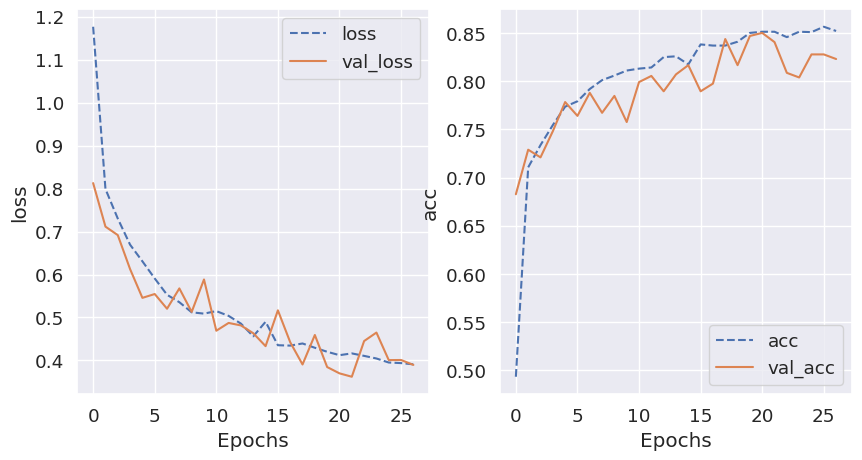

In [87]:
training_plot(['loss', 'acc'], revamp)

# Evaluate the model
result = revamp_cnn_model.evaluate(test_ds, verbose=2)
dict(zip(revamp_cnn_model.metrics_names, result))

6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step


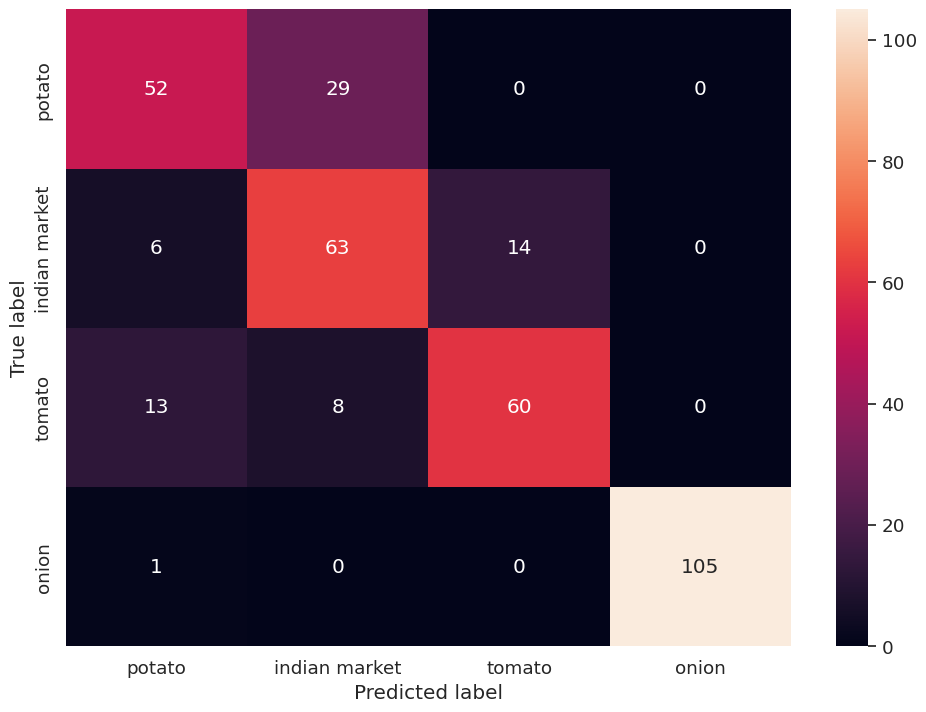

In [88]:
# Get class names from the test dataset
class_names = get_class_names(test_datapath)
# Get true labels from the test dataset
y_true = get_test_labels(test_ds)
# Get predictions from the model (predict on the whole dataset at once)
y_pred_probs = revamp_cnn_model.predict(test_ds)
y_pred = np.argmax(y_pred_probs, axis=1)
# Plot confusion matrix
plot_confusion_matrix(revamp_cnn_model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


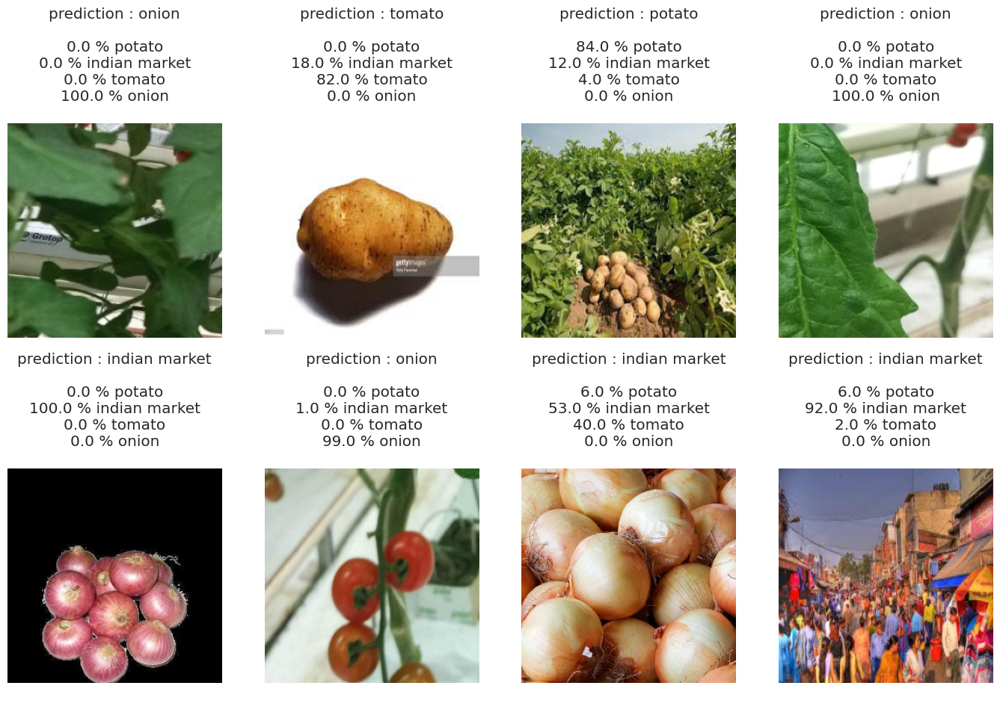

Accuracy for class indian market is 35.8% consisting of 81 images
Accuracy for class onion is 0.0% consisting of 83 images
Accuracy for class potato is 16.05% consisting of 81 images
Accuracy for class tomato is 0.0% consisting of 106 images


In [89]:
grid_test_model(revamp_cnn_model)

classwise_accuracy(noise_path, 'indian market', revamp_cnn_model)
classwise_accuracy(onion_path, 'onion', revamp_cnn_model)
classwise_accuracy(potato_path, 'potato', revamp_cnn_model)
classwise_accuracy(tomato_path, 'tomato', revamp_cnn_model)



---


## VGG-19

In [91]:
# load base model
base_model_vgg = tf.keras.applications.vgg19.VGG19(input_shape=(256, 256, 3), include_top = False)

# append classification layer
model_vgg = base_model_vgg.output

model_vgg = tf.keras.Sequential([
            #Normalizing 0-255 into 0 to 1
            tf.keras.layers.Rescaling(1./255,  input_shape=(*IMAGE_SIZE, 3)),
            base_model_vgg,
            tf.keras.layers.GlobalAveragePooling2D(),
            tf.keras.layers.Dropout(rate = 0.1),
            tf.keras.layers.Dense(4, activation = 'softmax')
        ])

model_vgg.summary()

Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_6 (Rescaling)         │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ vgg19 (Functional)              │ (None, 8, 8, 512)      │    20,024,384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_3      │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 20,026,436 (76.39 MB)

 Trainable params: 20,026,436 (76.39 MB)

 Non-trainable params: 0 (0.00 B)

In [92]:
log_dir_vgg = "logs/VGG19"

tensorboard_cb = tf.keras.callbacks.TensorBoard(log_dir=log_dir_vgg, histogram_freq=1)

checkpoint_cb = tf.keras.callbacks.ModelCheckpoint("VGG19.keras", save_best_only=True)

early_stopping_cb = tf.keras.callbacks.EarlyStopping(
    monitor = 'val_loss', patience = 5, restore_best_weights=True
)


model_vgg.compile(optimizer=tf.keras.optimizers.Adam(1e-4),
                  loss=tf.keras.losses.CategoricalCrossentropy(),
                  metrics=[tf.keras.metrics.CategoricalAccuracy(name='acc'),
                          tf.keras.metrics.Precision(name='precision'),
                          tf.keras.metrics.Recall(name='recall')])

history_vgg = model_vgg.fit(train_tuned_ds,  epochs=10,
                    validation_data=val_tuned_ds,
                    callbacks=[tensorboard_cb, checkpoint_cb, early_stopping_cb]
                   )

Epoch 1/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 274s 5s/step - acc: 0.3745 - loss: 1.2748 - precision: 0.4627 - recall: 0.1104 - val_acc: 0.7065 - val_loss: 0.7374 - val_precision: 0.8064 - val_recall: 0.4848
Epoch 2/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 80s 2s/step - acc: 0.7244 - loss: 0.6623 - precision: 0.8140 - recall: 0.5981 - val_acc: 0.8246 - val_loss: 0.4409 - val_precision: 0.8534 - val_recall: 0.7895
Epoch 3/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 84s 2s/step - acc: 0.8270 - loss: 0.4511 - precision: 0.8657 - recall: 0.7885 - val_acc: 0.8150 - val_loss: 0.4885 - val_precision: 0.8212 - val_recall: 0.7767
Epoch 4/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 145s 2s/step - acc: 0.8691 - loss: 0.3489 - precision: 0.8847 - recall: 0.8440 - val_acc: 0.8915 - val_loss: 0.3076 - val_precision: 0.9030 - val_recall: 0.8756
Epoch 5/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 135s 2s/step - acc: 0.8961 - loss: 0.3028 - precision: 0.9118 - recall: 0.8845 - val_acc: 0.7943 - val_loss: 0.6119 - val_precision: 0.8106 - val_recall: 0.7783
Epoch 6

6/6 - 3s - 546ms/step - acc: 0.9117 - loss: 0.2916 - precision: 0.9246 - recall: 0.9088


{'loss': 0.2915594279766083, 'compile_metrics': 0.9116809368133545}

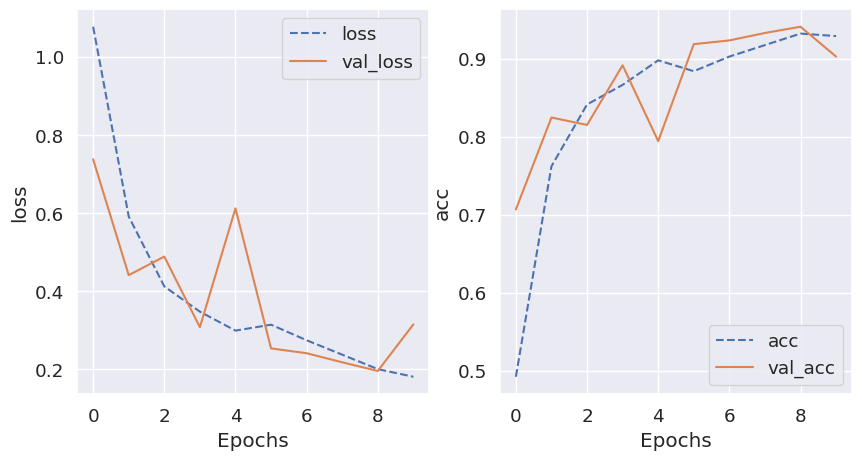

In [94]:
training_plot(['loss', 'acc'], history_vgg)

# Evaluate the model
result = model_vgg.evaluate(test_ds, verbose=2)
dict(zip(model_vgg.metrics_names, result))

6/6 ━━━━━━━━━━━━━━━━━━━━ 5s 630ms/step


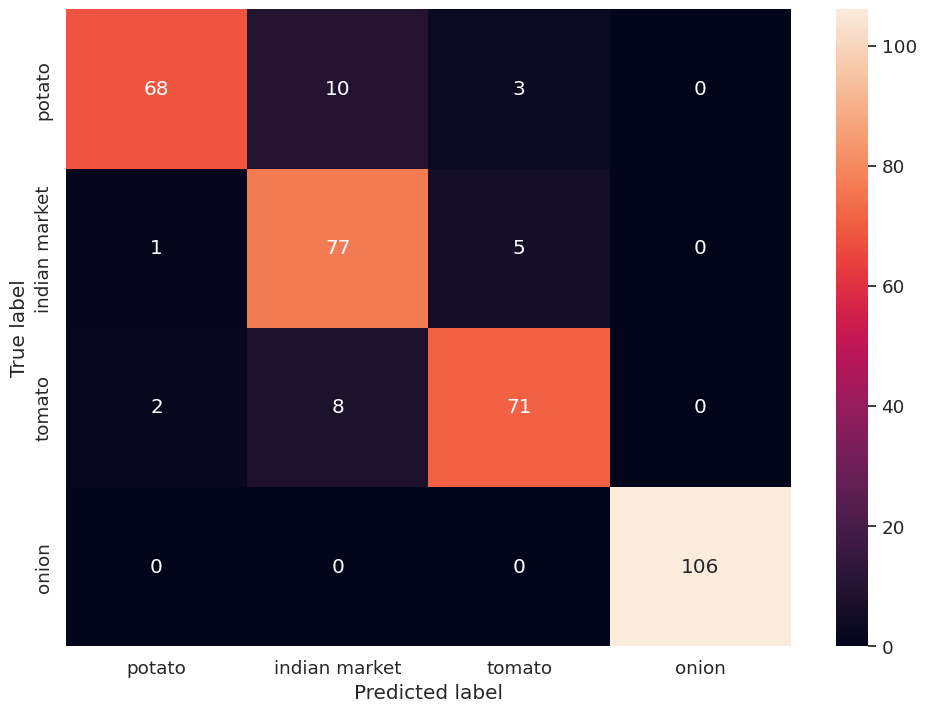

In [95]:
# Get class names from the test dataset
class_names = get_class_names(test_datapath)
# Get true labels from the test dataset
y_true = get_test_labels(test_ds)
# Get predictions from the model (predict on the whole dataset at once)
y_pred_probs = model_vgg.predict(test_ds)
y_pred = np.argmax(y_pred_probs, axis=1)
# Plot confusion matrix
plot_confusion_matrix(model_vgg)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


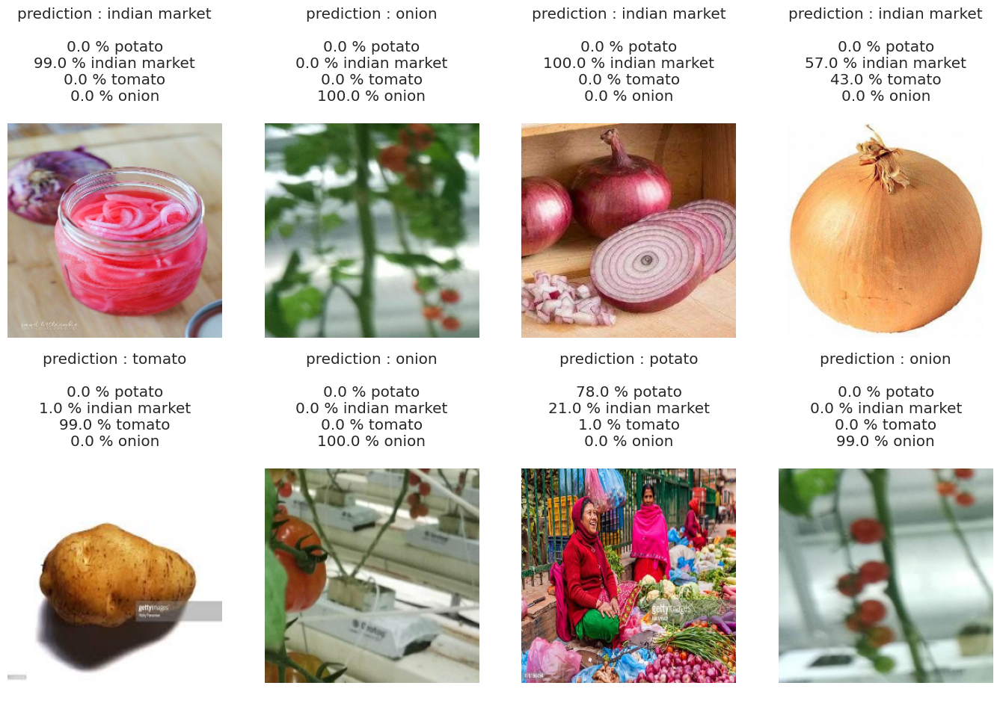

Accuracy for class indian market is 12.35% consisting of 81 images
Accuracy for class onion is 0.0% consisting of 83 images
Accuracy for class potato is 2.47% consisting of 81 images
Accuracy for class tomato is 0.0% consisting of 106 images


In [96]:
grid_test_model(model_vgg)

classwise_accuracy(noise_path, 'indian market', model_vgg)
classwise_accuracy(onion_path, 'onion', model_vgg)
classwise_accuracy(potato_path, 'potato', model_vgg)
classwise_accuracy(tomato_path, 'tomato', model_vgg)



---

## MobileNet Model

In [97]:
# load base model
base_model_mobile_net = tf.keras.applications.mobilenet.MobileNet(input_shape=(256, 256, 3), include_top = False)

# append classification layer
mobilenet_model = base_model_mobile_net.output

mobilenet_model = tf.keras.Sequential([
            #Normalizing 0-255 into 0 to 1
            tf.keras.layers.Rescaling(1./255, input_shape=(*IMAGE_SIZE, 3)),
            base_model_mobile_net,
            tf.keras.layers.GlobalAveragePooling2D(),
            tf.keras.layers.Dropout(rate = 0.1),
            tf.keras.layers.Dense(4, activation = 'softmax')
        ])
mobilenet_model.summary()

Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_7 (Rescaling)         │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenet_1.00_224 (Functional) │ (None, 8, 8, 1024)     │     3,228,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_4      │ (None, 1024)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 4)              │         4,100 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,232,964 (12.33 MB)

 Trainable params: 3,211,076 (12.25 MB)

 Non-trainable params: 21,888 (85.50 KB)

In [98]:
log_dir_mobilenet = "logs/MobileNet"

tensorboard_cb = tf.keras.callbacks.TensorBoard(log_dir=log_dir_mobilenet, histogram_freq=1)

checkpoint_cb = tf.keras.callbacks.ModelCheckpoint("MobileNet.keras", save_best_only=True)

early_stopping_cb = tf.keras.callbacks.EarlyStopping(
    monitor = 'val_loss', patience = 5, restore_best_weights=True
)


mobilenet_model.compile(optimizer=tf.keras.optimizers.Adam(1e-4),
                  loss=tf.keras.losses.CategoricalCrossentropy(),
                  metrics=[tf.keras.metrics.CategoricalAccuracy(name='acc'),
                          tf.keras.metrics.Precision(name='precision'),
                          tf.keras.metrics.Recall(name='recall')])

print(mobilenet_model.optimizer.get_config())
history_mobilenet = mobilenet_model.fit(train_tuned_ds,  epochs=10,
                    validation_data=val_tuned_ds,
                    callbacks=[tensorboard_cb, checkpoint_cb, early_stopping_cb]
                   )

{'name': 'adam', 'learning_rate': 9.999999747378752e-05, 'weight_decay': None, 'clipnorm': None, 'global_clipnorm': None, 'clipvalue': None, 'use_ema': False, 'ema_momentum': 0.99, 'ema_overwrite_frequency': None, 'loss_scale_factor': None, 'gradient_accumulation_steps': None, 'beta_1': 0.9, 'beta_2': 0.999, 'epsilon': 1e-07, 'amsgrad': False}
Epoch 1/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 98s 1s/step - acc: 0.7151 - loss: 0.7527 - precision: 0.7677 - recall: 0.6388 - val_acc: 0.8836 - val_loss: 0.3667 - val_precision: 0.8954 - val_recall: 0.8740
Epoch 2/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 44s 1s/step - acc: 0.9539 - loss: 0.1321 - precision: 0.9591 - recall: 0.9463 - val_acc: 0.9378 - val_loss: 0.2025 - val_precision: 0.9392 - val_recall: 0.9362
Epoch 3/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 44s 1s/step - acc: 0.9722 - loss: 0.0841 - precision: 0.9745 - recall: 0.9680 - val_acc: 0.9553 - val_loss: 0.1441 - val_precision: 0.9583 - val_recall: 0.9537
Epoch 4/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 82s 1s/step - acc: 0.9

6/6 - 4s - 664ms/step - acc: 0.9573 - loss: 0.1420 - precision: 0.9623 - recall: 0.9459


{'loss': 0.14198185503482819, 'compile_metrics': 0.9572649598121643}

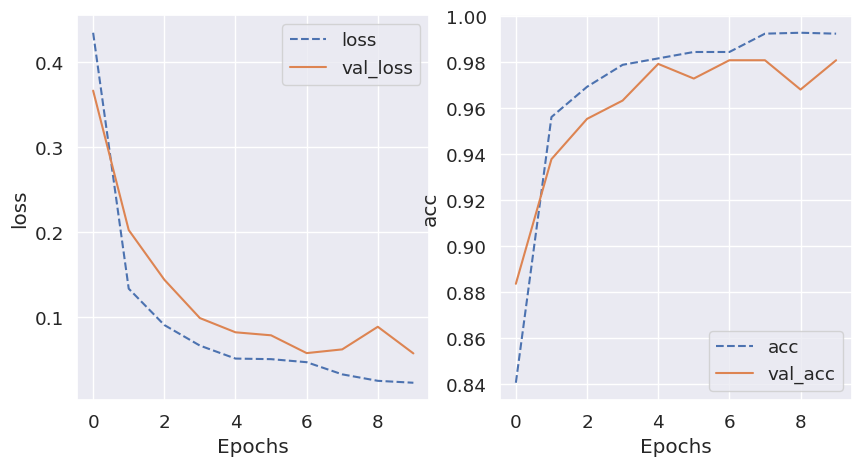

In [99]:
training_plot(['loss', 'acc'], history_mobilenet)

# Evaluate the model
result = mobilenet_model.evaluate(test_ds, verbose=2)
dict(zip(mobilenet_model.metrics_names, result))

6/6 ━━━━━━━━━━━━━━━━━━━━ 5s 514ms/step


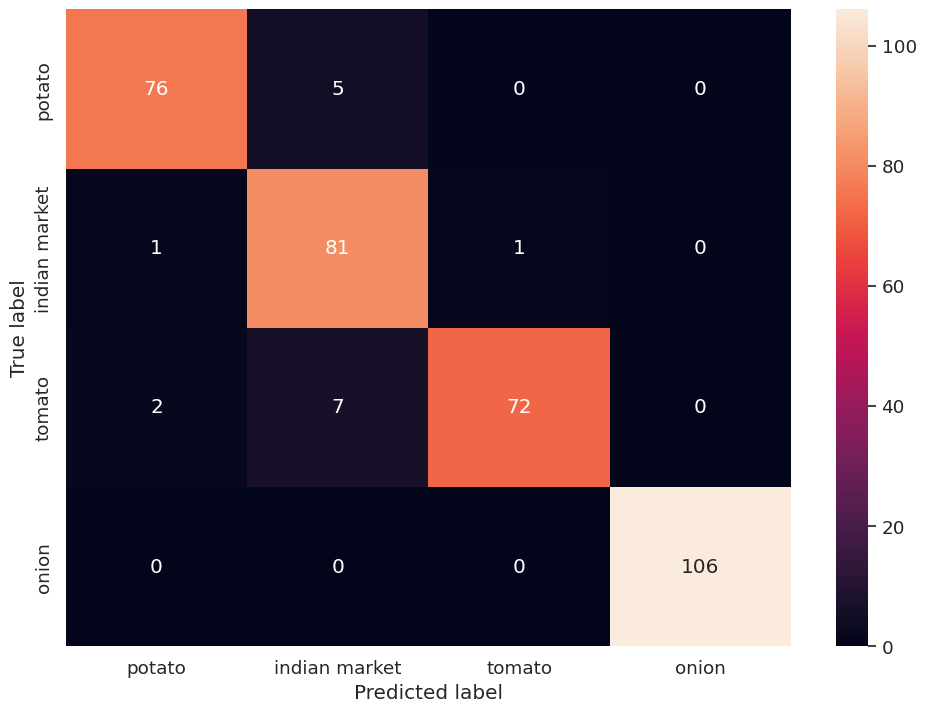

In [100]:
# Get class names from the test dataset
class_names = get_class_names(test_datapath)
# Get true labels from the test dataset
y_true = get_test_labels(test_ds)
# Get predictions from the model (predict on the whole dataset at once)
y_pred_probs = mobilenet_model.predict(test_ds)
y_pred = np.argmax(y_pred_probs, axis=1)
# Plot confusion matrix
plot_confusion_matrix(mobilenet_model)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


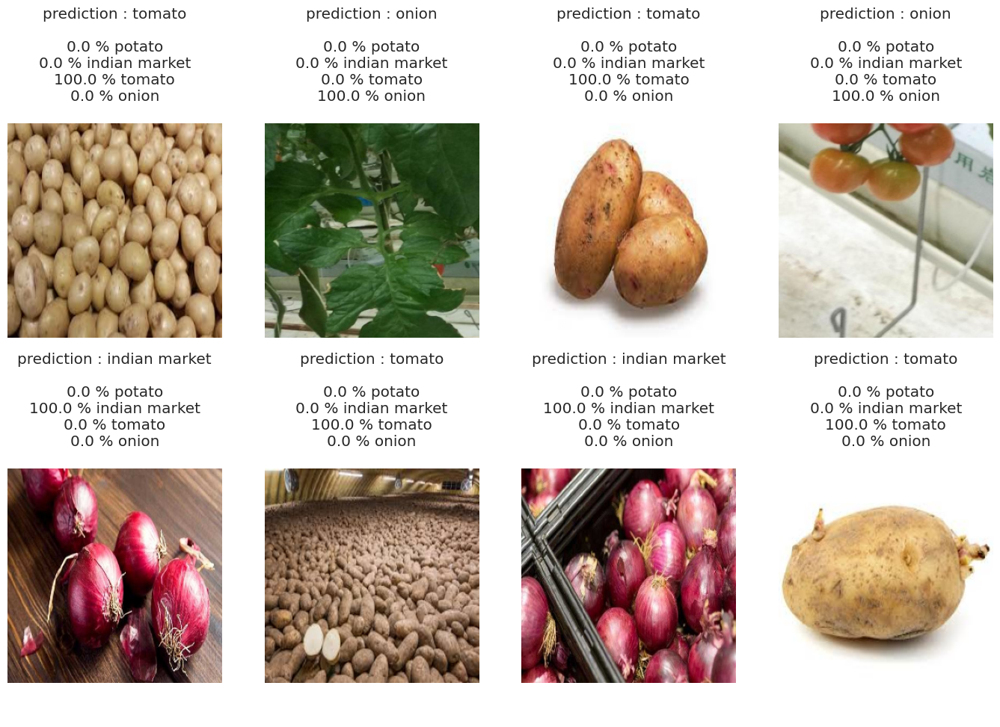

Accuracy for class indian market is 6.17% consisting of 81 images
Accuracy for class onion is 0.0% consisting of 83 images
Accuracy for class potato is 2.47% consisting of 81 images
Accuracy for class tomato is 0.0% consisting of 106 images


In [101]:
grid_test_model(mobilenet_model)

classwise_accuracy(noise_path, 'indian market', mobilenet_model)
classwise_accuracy(onion_path, 'onion', mobilenet_model)
classwise_accuracy(potato_path, 'potato', mobilenet_model)
classwise_accuracy(tomato_path, 'tomato', mobilenet_model)

## ResNet Model

In [102]:
# load base model
base_model_resnet = tf.keras.applications.resnet50.ResNet50(input_shape=(256, 256, 3), include_top = False)

model_resnet = tf.keras.Sequential([
            #Normalizing 0-255 into 0 to 1
            tf.keras.layers.Rescaling(1./255, input_shape=(*IMAGE_SIZE, 3)),
            base_model_resnet,
            tf.keras.layers.GlobalAveragePooling2D(),
            tf.keras.layers.Dropout(rate = 0.1),
            tf.keras.layers.Dense(4, activation = 'softmax')
        ])

model_resnet.summary()

Model: "sequential_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_8 (Rescaling)         │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet50 (Functional)           │ (None, 8, 8, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_5      │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 4)              │         8,196 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,595,908 (90.01 MB)

 Trainable params: 23,542,788 (89.81 MB)

 Non-trainable params: 53,120 (207.50 KB)

In [103]:
log_dir_resnet = "logs/ResNet"

tensorboard_cb = tf.keras.callbacks.TensorBoard(log_dir=log_dir_resnet, histogram_freq=1)

checkpoint_cb = tf.keras.callbacks.ModelCheckpoint("ResNet.keras", save_best_only=True)

early_stopping_cb = tf.keras.callbacks.EarlyStopping(
    monitor = 'val_loss', patience = 5, restore_best_weights=True
)

opt = SGD(learning_rate=0.005, momentum=0.99)
model_resnet.compile(optimizer=tf.keras.optimizers.Adam(1e-4),
                  loss=tf.keras.losses.CategoricalCrossentropy(),
                  metrics=[tf.keras.metrics.CategoricalAccuracy(name='acc'),
                          tf.keras.metrics.Precision(name='precision'),
                          tf.keras.metrics.Recall(name='recall')]
)

print(model_resnet.optimizer.get_config())
history_resnet = model_resnet.fit(train_tuned_ds,  epochs=10,
                    validation_data=val_tuned_ds,
                    callbacks=[tensorboard_cb, checkpoint_cb, early_stopping_cb]
                   )

{'name': 'adam', 'learning_rate': 9.999999747378752e-05, 'weight_decay': None, 'clipnorm': None, 'global_clipnorm': None, 'clipvalue': None, 'use_ema': False, 'ema_momentum': 0.99, 'ema_overwrite_frequency': None, 'loss_scale_factor': None, 'gradient_accumulation_steps': None, 'beta_1': 0.9, 'beta_2': 0.999, 'epsilon': 1e-07, 'amsgrad': False}
Epoch 1/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 177s 2s/step - acc: 0.7863 - loss: 0.5553 - precision: 0.8362 - recall: 0.7348 - val_acc: 0.1627 - val_loss: 7.7529 - val_precision: 0.1627 - val_recall: 0.1627
Epoch 2/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 61s 1s/step - acc: 0.9798 - loss: 0.0656 - precision: 0.9801 - recall: 0.9771 - val_acc: 0.1627 - val_loss: 2.7502 - val_precision: 0.1627 - val_recall: 0.1627
Epoch 3/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 57s 1s/step - acc: 0.9846 - loss: 0.0459 - precision: 0.9866 - recall: 0.9837 - val_acc: 0.1627 - val_loss: 4.2212 - val_precision: 0.1627 - val_recall: 0.1627
Epoch 4/10
40/40 ━━━━━━━━━━━━━━━━━━━━ 82s 1s/step - acc: 0.

6/6 - 6s - 923ms/step - acc: 0.2308 - loss: 2.6260 - precision: 0.2308 - recall: 0.2308


{'loss': 2.626025438308716, 'compile_metrics': 0.23076923191547394}

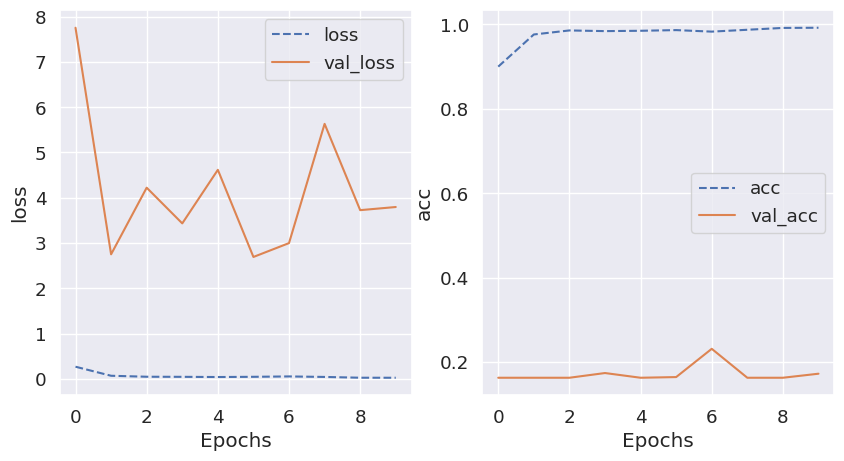

In [104]:
training_plot(['loss', 'acc'], history_resnet)

# Evaluate the model
result = model_resnet.evaluate(test_ds, verbose=2)
dict(zip(model_resnet.metrics_names, result))

6/6 ━━━━━━━━━━━━━━━━━━━━ 9s 887ms/step


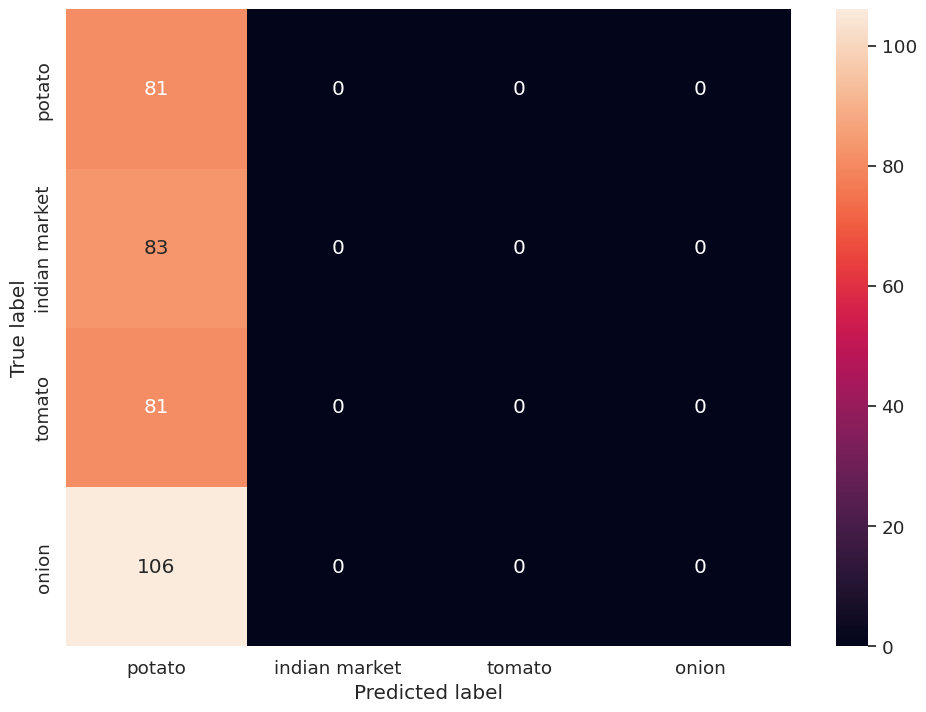

In [105]:
# Get class names from the test dataset
class_names = get_class_names(test_datapath)
# Get true labels from the test dataset
y_true = get_test_labels(test_ds)
# Get predictions from the model (predict on the whole dataset at once)
y_pred_probs = model_resnet.predict(test_ds)
y_pred = np.argmax(y_pred_probs, axis=1)
# Plot confusion matrix
plot_confusion_matrix(model_resnet)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


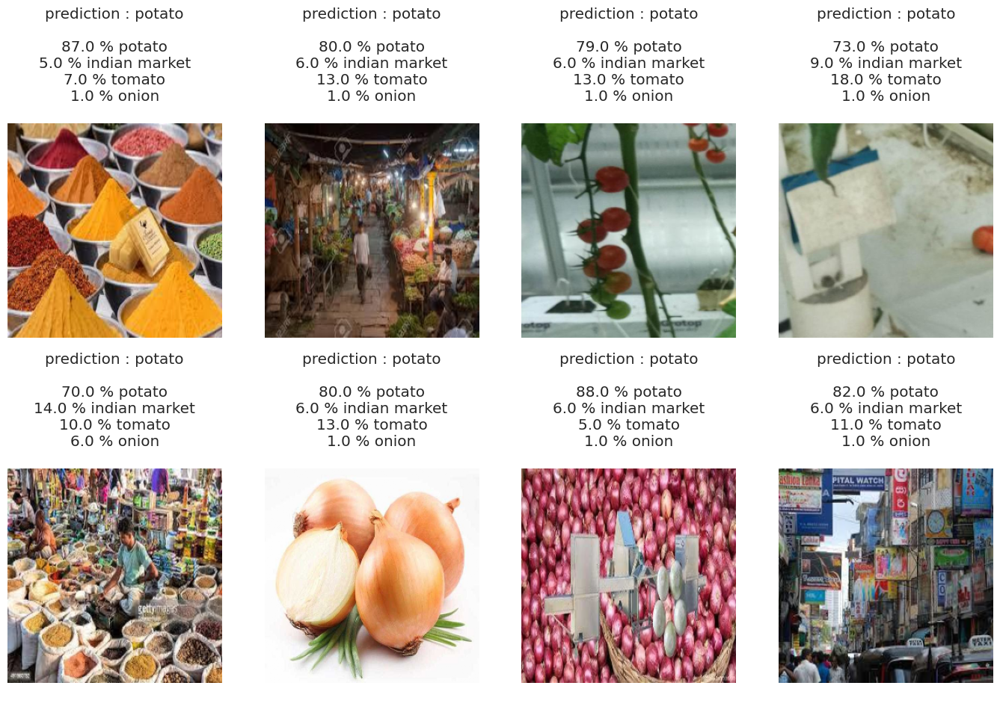

Accuracy for class indian market is 0.0% consisting of 81 images
Accuracy for class onion is 0.0% consisting of 83 images
Accuracy for class potato is 100.0% consisting of 81 images
Accuracy for class tomato is 0.0% consisting of 106 images


In [106]:
grid_test_model(model_resnet)

classwise_accuracy(noise_path, 'indian market', model_resnet)
classwise_accuracy(onion_path, 'onion', model_resnet)
classwise_accuracy(potato_path, 'potato', model_resnet)
classwise_accuracy(tomato_path, 'tomato', model_resnet)